# 逻辑回归

## 数据处理

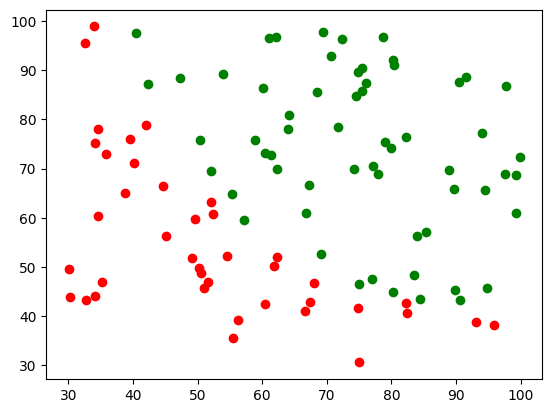

In [147]:
import numpy as np
import matplotlib.pyplot as plt

# 数据读取
data = np.loadtxt("data1.txt", delimiter=",")
X = data[:,0:-1]
y = data[:,-1]
m = len(y)

# 简单画图，对数据有个直观的印象
# 因为是逻辑回归，所以将0和1按照不同颜色打印出来
class1 = np.where(y == 0)
class2 = np.where(y == 1)

plt.plot(X[class1, 0], X[class1, 1], 'ro')
plt.plot(X[class2, 0], X[class2, 1], 'go')

plt.show()

In [148]:
print("X[0]的范围为:", min(X[:,0]), " - ", max(X[:,0]))
print("X[1]的范围为:", min(X[:,1]), " - ", max(X[:,1]))
print("y的范围为:", min(y), " - ", max(y))
print("数据个数m为:", m)

X[0]的范围为: 30.05882244669796  -  99.82785779692128
X[1]的范围为: 30.60326323428011  -  98.86943574220611
y的范围为: 0.0  -  1.0
数据个数m为: 100


数据范围相差不大，就不进行数据的归一化操作了。接下来需要构建线性模型。

## 构建模型
### 初始线性模型
需要完成的部分有代价函数的计算以及梯度的计算

In [149]:
# 梯度下降算法 （公式和线性回归是相同的，只是计算y的方式改变）

# 初始化w = (w;b)
w = np.zeros((data.shape[1],1))

# X添加一列
X = np.column_stack((X, np.ones((m, 1))))

# 学习率
alpha = 0.001

temp = 0
J = 1

# 梯度下降
while abs(J - temp) > 0.000001:
    temp = J
    J = (-1.0) / m * (np.dot(np.transpose(y), np.log(1.0 / (1.0 + np.exp(-1.0 * np.dot(X, w))))) + np.dot(np.transpose(1 - y), np.log(1.0 - 1.0 / (1.0 + np.exp(-1.0 * np.dot(X, w))))))
    w = w - alpha / m * np.dot(np.transpose(X), (1.0 / (1.0 + np.exp(-1.0 * np.dot(X, w))) - y.reshape(-1, 1)))

print(w)

[[ 0.04771453]
 [ 0.04072422]
 [-5.13367176]]


预测结果与数据不符的个数为:  9 
准确度为:  0.91


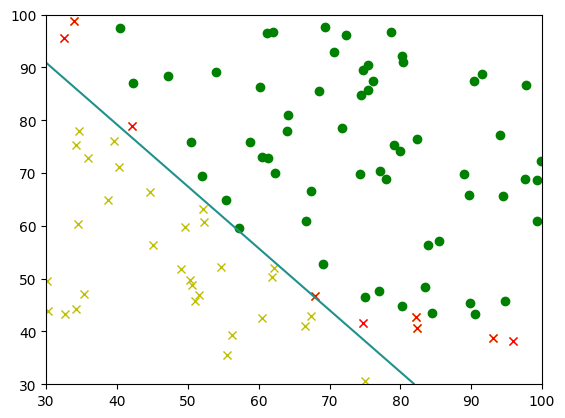

In [150]:
# 测试训练结果
f = 0
result = 1.0 / (1.0 + np.exp(-1 * np.dot(X, w)))

for i in range(m):
    if result[i] > 0.5:
        result[i] = 1
    else:
        result[i] = 0
    if result[i] != y[i]:
        f += 1
        if y[i] == 0:
            y[i] = 2
        else:
            y[i] = 3

print("预测结果与数据不符的个数为: ", f,
      "\n准确度为: ", 1.0 - f / m)

# 画图感受一下训练结果
class3 = np.where(y == 2)
class4 = np.where(y == 3)
plt.plot(X[class1, 0], X[class1, 1], 'yx')
plt.plot(X[class2, 0], X[class2, 1], 'go')
plt.plot(X[class3, 0], X[class3, 1], 'rx')
plt.plot(X[class4, 0], X[class4, 1], 'ro')

# 绘制决策边界，具体实现方法就是绘制计算图中采样点的值，并且将其等于0的等高线绘制出来
# 采样点
u = np.linspace(30, 100, 1000)
v = np.linspace(30, 100, 1000)

# 计算采样点取值
sample = np.zeros((len(u),len(v)))
for i in range(len(u)):
    for j in range(len(v)):
        temp = [u[i], v[j], 1]
        sample[i, j] = np.dot(temp, w)

sample = np.transpose(sample)
plt.contour(u, v, sample, 0)
plt.show()

### 模型改进
从上图我们可以看到，预测的效果并不是很好，这是因为我们选择的线性模型不能很好的契合数据。我们应当选择曲线的边界曲线，这样可以更好的得到结果。于是我们需要对当前的线性模型进行一些改进。

In [151]:
# 构造特征,加入X^2特征
import numpy as np

data = np.loadtxt("data1.txt", delimiter=",")
X = data[:,0:-1]
y = data[:,-1]
m = len(y)

for i in range(X.shape[1]):
    temp = X[:,i]
    temp = temp * temp
    temp = temp.reshape(-1, 1)
    X = np.column_stack((X, temp))

temp = X[:,0] * X[:,1]
X = np.column_stack((X, temp))

X = np.column_stack((X, np.ones((m, 1))))

print("X[0]的范围为:", min(X[:,0]), " - ", max(X[:,0]))
print("X[1]的范围为:", min(X[:,1]), " - ", max(X[:,1]))
print("X[2]的范围为:", min(X[:,2]), " - ", max(X[:,2]))
print("X[3]的范围为:", min(X[:,3]), " - ", max(X[:,3]))
print("X[4]的范围为:", min(X[:,4]), " - ", max(X[:,4]))

X[0]的范围为: 30.05882244669796  -  99.82785779692128
X[1]的范围为: 30.60326323428011  -  98.86943574220611
X[2]的范围为: 903.5328068821132  -  9965.601192322336
X[3]的范围为: 936.5597205866407  -  9775.165323982223
X[4]的范围为: 1329.4350941814182  -  8479.517891278754


这里我也思考需不需要做特征的归一化，因为新构造的特征的范围与原本特征的范围相差较大。
上网搜索我得到下列答案：逻辑回归、决策树、基于决策树的Boosting和Bagging等集成学习模型对于特征取值大小并不敏感。所以这类模型一般不需要做数据标准化处理。
于是不进行特征归一化。

In [152]:
# 定义新的w
w = np.zeros((X.shape[1],1))

# 学习率
alpha = 0.0000001

temp = 0
J = 1

# 梯度下降
while abs(J - temp) > 0.0000001:
    temp = J
    J = (-1.0) / m * (np.dot(np.transpose(y), np.log(1.0 / (1.0 + np.exp(-1.0 * np.dot(X, w))))) + np.dot(np.transpose(1 - y), np.log(1.0 - 1.0 / (1.0 + np.exp(-1.0 * np.dot(X, w))))))
    w = w - alpha / m * np.dot(np.transpose(X), (1.0 / (1.0 + np.exp(-1.0 * np.dot(X, w))) - y.reshape(-1, 1)))
    print(J)

print(w)

[0.69314718]
[0.61564588]
[0.58550269]
[0.58490511]
[0.58442643]
[0.58398411]
[0.58356504]
[0.58316381]
[0.58277664]
[0.58240067]
[0.58203372]
[0.58167412]
[0.58132058]
[0.58097213]
[0.580628]
[0.58028762]
[0.57995056]
[0.57961646]
[0.57928507]
[0.57895619]
[0.57862966]
[0.57830535]
[0.57798318]
[0.57766307]
[0.57734496]
[0.5770288]
[0.57671456]
[0.5764022]
[0.5760917]
[0.57578304]
[0.5754762]
[0.57517116]
[0.57486791]
[0.57456644]
[0.57426674]
[0.57396878]
[0.57367257]
[0.57337809]
[0.57308534]
[0.57279429]
[0.57250496]
[0.57221731]
[0.57193136]
[0.57164708]
[0.57136447]
[0.57108352]
[0.57080423]
[0.57052657]
[0.57025056]
[0.56997616]
[0.56970339]
[0.56943222]
[0.56916266]
[0.56889469]
[0.5686283]
[0.56836349]
[0.56810024]
[0.56783855]
[0.56757842]
[0.56731983]
[0.56706277]
[0.56680724]
[0.56655322]
[0.56630072]
[0.56604971]
[0.5658002]
[0.56555218]
[0.56530563]
[0.56506055]
[0.56481694]
[0.56457477]
[0.56433405]
[0.56409477]
[0.56385692]
[0.56362048]
[0.56338546]
[0.56315185]
[0.5629

预测结果与数据不符的个数为:  2 
准确度为:  0.98


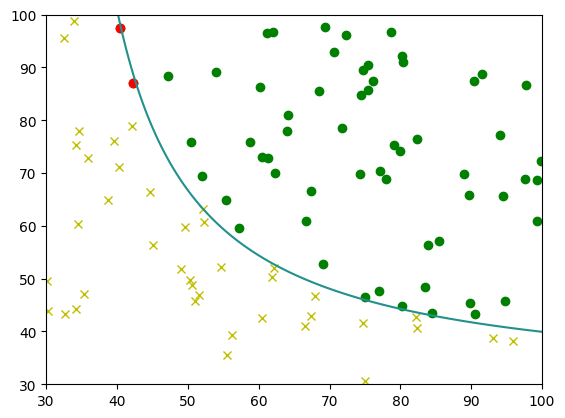

In [153]:
# 测试训练结果
f = 0
result = 1.0 / (1.0 + np.exp(-1 * np.dot(X, w)))

for i in range(m):
    if result[i] > 0.5:
        result[i] = 1
    else:
        result[i] = 0
    if result[i] != y[i]:
        f += 1
        if y[i] == 0:
            y[i] = 2
        else:
            y[i] = 3

print("预测结果与数据不符的个数为: ", f,
      "\n准确度为: ", 1.0 - f / m)

# 画图感受一下训练结果
class3 = np.where(y == 2)
class4 = np.where(y == 3)
plt.plot(X[class1, 0], X[class1, 1], 'yx')
plt.plot(X[class2, 0], X[class2, 1], 'go')
plt.plot(X[class3, 0], X[class3, 1], 'rx')
plt.plot(X[class4, 0], X[class4, 1], 'ro')

# 绘制决策边界，具体实现方法就是绘制计算图中采样点的值，并且将其等于0的等高线绘制出来
# 采样点
u = np.linspace(30, 100, 100)
v = np.linspace(30, 100, 100)

# 计算采样点取值
sample = np.zeros((len(u),len(v)))
for i in range(len(u)):
    for j in range(len(v)):
        temp = [u[i], v[j], u[i] * u[i], v[j] * v[j], u[i] * v[j], 1]
        sample[i, j] = np.dot(temp, w)

sample = np.transpose(sample)
plt.contour(u, v, sample, 0)
plt.show()